In [1]:
import warnings
warnings.filterwarnings("ignore")

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.gridspec import GridSpec
from matplotlib.lines import Line2D
from matplotlib import colors as mcolors

import scanpy as sc
import squidpy as sq
import cellcharter as cc
import scvi

from pandas.api.types import is_numeric_dtype, is_categorical_dtype
from scipy.sparse import issparse


# ------------------------------------------------------------------
# 1) Define and apply course + region + sample_id order
# ------------------------------------------------------------------
course_order = [
    "MOG CFA",
    "early onset",
    "chronic peak",
    "chronic long",

    "PLP CFA",
    "non symptomatic",
    "monophasic",

    "onset I",
    "onset II",
    "peak I",
    "remitt I",
    "peak II",
    "remitt II",
    "peak III",
]

region_order = ["L", "T", "C"]


def apply_course_region_and_sample_order(ad, sample_key="sample_id"):
    """Make ad.obs['course'], ad.obs['region'], and ad.obs[sample_key] ordered categoricals."""
    # --- course ---
    if "course" in ad.obs.columns:
        ad.obs["course"] = ad.obs["course"].astype(
            pd.CategoricalDtype(categories=course_order, ordered=True)
        )

    # --- region ---
    if "region" in ad.obs.columns:
        ad.obs["region"] = ad.obs["region"].astype(
            pd.CategoricalDtype(categories=region_order, ordered=True)
        )

    # --- sample_id ordered by (course, region, sample_id) ---
    if (
        sample_key in ad.obs.columns
        and "course" in ad.obs.columns
        and "region" in ad.obs.columns
    ):
        tmp = (
            ad.obs[[sample_key, "course", "region"]]
            .drop_duplicates()
            .dropna(subset=["course", "region"])
            .copy()
        )

        tmp["course"] = tmp["course"].astype(
            pd.CategoricalDtype(categories=course_order, ordered=True)
        )
        tmp["region"] = tmp["region"].astype(
            pd.CategoricalDtype(categories=region_order, ordered=True)
        )

        tmp = tmp.sort_values(["course", "region", sample_key])
        sample_order = tmp[sample_key].tolist()

        ad.obs[sample_key] = ad.obs[sample_key].astype(
            pd.CategoricalDtype(categories=sample_order, ordered=True)
        )

        ad.uns[f"{sample_key}_order_by_course_region"] = sample_order

    return ad


# ------------------------------------------------------------------
# 2) Plot function (obs + genes, ordered groupby, shared vmin/vmax)
# ------------------------------------------------------------------
def plot_spatial_compact_fast(
    ad,
    color="leiden_2",       # obs column *or* gene name
    groupby="sample_id",
    spot_size=8,
    cols=3,
    height=8,
    legend_col_width=1.2,
    palette=None,
    rasterized=True,
    invert_y=True,
    dpi=120,
    highlight=None,
    group_order=None,
    background="white",
    grey_alpha=0.2,         # alpha for non-highlighted categories
    vmin=None,
    vmax=None,
    cmap_name="viridis",
    shared_scale=False,     # if True: vmin/vmax from whole `ad` (not per subset)
):
    # pick background + text color
    fig_face = background
    ax_face = background
    text_color = "white" if background in ("black", "#000000", "k") else "black"

    # ----- 0) Preconditions -----
    if "spatial" not in ad.obsm:
        raise ValueError("ad.obsm['spatial'] not found")

    if groupby not in ad.obs.columns:
        raise KeyError(f"groupby {groupby!r} not in ad.obs")

    # decide where 'color' comes from: obs vs var (gene)
    if color in ad.obs.columns:
        color_source = "obs"
        col_series = ad.obs[color]
    elif color in ad.var_names:
        color_source = "var"   # gene expression
        col_series = None
    else:
        raise KeyError(
            f"{color!r} not found in ad.obs.columns or ad.var_names "
            "(expected an obs column or a gene name)."
        )

    coords = np.asarray(ad.obsm["spatial"])[:, :2]

    # Detect continuous vs categorical
    if color_source == "var":
        # genes: always continuous
        is_continuous = True
    else:
        if is_categorical_dtype(col_series):
            is_continuous = False
        else:
            is_continuous = is_numeric_dtype(col_series)

    # ----------------------------------------------------
    # 1) Build colors_arr differently for cont vs cat
    # ----------------------------------------------------
    if is_continuous:
        # ===== CONTINUOUS MODE =====
        if color_source == "obs":
            vals = col_series.to_numpy(dtype=float)
        else:
            # from var / gene expression
            gene_idx = ad.var_names.get_loc(color)
            x = ad.X[:, gene_idx]
            if issparse(x):
                vals = x.toarray().ravel()
            else:
                vals = np.asarray(x).ravel()

        # choose colormap
        if palette is None:
            cmap = plt.get_cmap(cmap_name)
        elif isinstance(palette, str):
            cmap = plt.get_cmap(palette)
        else:
            cmap = palette

        # ----- determine vmin/vmax -----
        if shared_scale:
            # global min/max across the *full AnnData* passed to this function
            full = ad
            if color_source == "var":
                gx = full.X[:, full.var_names.get_loc(color)]
                if issparse(gx):
                    full_vals = gx.toarray().ravel()
                else:
                    full_vals = np.asarray(gx).ravel()
            else:
                full_vals = pd.to_numeric(full.obs[color], errors="coerce").to_numpy()

            finite_full = np.isfinite(full_vals)
            if finite_full.sum() == 0:
                raise ValueError(f"All values for '{color}' are NaN or non-finite.")
            vmin_use = float(np.min(full_vals[finite_full]))
            vmax_use = float(np.max(full_vals[finite_full]))
        else:
            finite_mask = np.isfinite(vals)
            if finite_mask.sum() == 0:
                raise ValueError(f"All values for '{color}' are NaN or non-finite.")
            vmin_use = float(np.min(vals[finite_mask]))
            vmax_use = float(np.max(vals[finite_mask]))

        # user overrides everything
        if vmin is not None:
            vmin_use = float(vmin)
        if vmax is not None:
            vmax_use = float(vmax)

        # avoid zero-range
        if vmin_use == vmax_use:
            vmin_use -= 1.0
            vmax_use += 1.0

        norm = mcolors.Normalize(vmin=vmin_use, vmax=vmax_use)

        colors_arr = np.zeros((vals.size, 4), dtype=float)
        finite_mask = np.isfinite(vals)
        colors_arr[finite_mask] = cmap(norm(vals[finite_mask]))
        colors_arr[~finite_mask] = (0, 0, 0, 0)

        # store continuous settings in uns (also fine for genes)
        ad.uns[f"{color}_continuous"] = {
            "vmin": float(vmin_use),
            "vmax": float(vmax_use),
            "cmap": cmap.name if hasattr(cmap, "name") else str(cmap),
        }

        cat_names = None
        cat_codes = None

    else:
        # ===== CATEGORICAL (only for obs) =====
        # preserve existing categorical order if present
        if is_categorical_dtype(col_series):
            cats = col_series.cat.remove_unused_categories()
        else:
            cats = col_series.astype("category")

        cat_names = cats.cat.categories
        cat_codes = cats.cat.codes.to_numpy()

        # palette handling
        if isinstance(palette, dict):
            col_list = [palette[c] for c in cat_names]
        elif isinstance(palette, (list, tuple)):
            if len(palette) < len(cat_names):
                raise ValueError("Palette shorter than number of categories.")
            col_list = list(palette)[:len(cat_names)]
        elif f"{color}_colors" in ad.uns:
            col_list = list(ad.uns[f"{color}_colors"])
            if len(col_list) != len(cat_names):
                raise ValueError(f"{color}_colors length != categories.")
        else:
            base = list(
                sc.pl.palettes.default_64
                if hasattr(sc.pl.palettes, "default_64")
                else sc.pl.palettes.default_102
            )
            reps = int(np.ceil(len(cat_names) / len(base)))
            col_list = (base * reps)[:len(cat_names)]

        ad.uns[f"{color}_colors"] = col_list

        rgba = np.array([mcolors.to_rgba(c) for c in col_list], dtype=float)

        colors_arr = np.empty((cat_codes.size, 4), dtype=float)
        colors_arr[cat_codes >= 0] = rgba[cat_codes[cat_codes >= 0]]
        colors_arr[cat_codes < 0] = (0, 0, 0, 0)

        # ----- highlighting logic -----
        if highlight is not None:
            # allow single value or list/tuple/array
            if not isinstance(highlight, (list, tuple, set, np.ndarray)):
                highlight = [highlight]
            # convert to string for robust matching
            highlight_str = {str(h) for h in highlight}

            cat_name_str = np.array([str(c) for c in cat_names])
            keep_cat_mask = np.isin(cat_name_str, list(highlight_str))  # per-category

            # use user-defined alpha for greyed-out categories
            grey_rgba = (0.8, 0.8, 0.8, float(grey_alpha))

            valid = cat_codes >= 0
            keep_flag = np.zeros_like(cat_codes, dtype=bool)
            keep_flag[valid] = keep_cat_mask[cat_codes[valid]]

            # grey out all non-highlighted cells
            colors_arr[valid & ~keep_flag] = grey_rgba

            # also grey in legend
            col_list = [
                col_list[k] if keep_cat_mask[k] else mcolors.to_hex(grey_rgba)
                for k in range(len(cat_names))
            ]

    # ----------------------------------------------------
    # 2) Precompute group indices (RESPECT ORDERED CATEGORICAL)
    # ----------------------------------------------------
    gser = ad.obs[groupby]

    if group_order is not None:
        group_order = [str(g) for g in group_order]
        present = set(gser.astype(str))
        uniq_groups = [g for g in group_order if g in present]
    else:
        # if groupby is an ordered categorical, respect its category order
        if is_categorical_dtype(gser) and gser.cat.ordered:
            cats = list(gser.cat.categories)
            present = set(gser.astype(str))
            uniq_groups = [str(c) for c in cats if str(c) in present]
        else:
            # fallback: sorted unique strings
            uniq_groups = sorted(gser.astype(str).unique())

    gvals = gser.astype(str).to_numpy()
    gid_to_idx = {g: i for i, g in enumerate(uniq_groups)}
    gcodes = np.array([gid_to_idx.get(g, -1) for g in gvals], dtype=int)

    group_indices = [np.flatnonzero(gcodes == gi) for gi in range(len(uniq_groups))]

    # ----------------------------------------------------
    # 3) Figure layout
    # ----------------------------------------------------
    n = len(uniq_groups)
    rows = int(np.ceil(n / cols))
    panel_w = height * cols * 0.6 / rows
    fig_w = panel_w + legend_col_width

    plt.ioff()
    fig = plt.figure(figsize=(fig_w, height), dpi=dpi, constrained_layout=False)

    # background for figure
    fig.patch.set_facecolor(fig_face)

    gs = GridSpec(
        rows, cols + 1, figure=fig,
        width_ratios=[1]*cols + [legend_col_width / (fig_w - legend_col_width)],
        wspace=0.02, hspace=0.02
    )

    # ----------------------------------------------------
    # 4) Panels
    # ----------------------------------------------------
    for i, sid in enumerate(uniq_groups):
        r, c = divmod(i, cols)
        ax = fig.add_subplot(gs[r, c])

        # panel background
        ax.set_facecolor(ax_face)

        idx = group_indices[i]
        if idx.size:
            xy = coords[idx]
            ax.scatter(
                xy[:, 0], -xy[:, 1],
                c=colors_arr[idx],
                s=spot_size,
                marker='o',
                linewidths=0,
                rasterized=rasterized
            )

        meta_strings = []

        if "region" in ad.obs.columns:
            region_vals = (
                ad.obs.loc[ad.obs[groupby] == sid, "region"]
                .dropna().astype(str).unique()
            )
            if len(region_vals) == 0:
                meta_strings.append("Region: unknown")
            elif len(region_vals) == 1:
                meta_strings.append(f"Region: {region_vals[0]}")
            else:
                meta_strings.append("Region: mixed")

        if "course" in ad.obs.columns:
            course_vals = (
                ad.obs.loc[ad.obs[groupby] == sid, "course"]
                .dropna().astype(str).unique()
            )
            if len(course_vals) == 0:
                meta_strings.append("Course: unknown")
            elif len(course_vals) == 1:
                meta_strings.append(f"Course: {course_vals[0]}")
            else:
                meta_strings.append("Course: mixed")

        if meta_strings:
            title = f"{sid}\n[{ ' | '.join(meta_strings) }]"
        else:
            title = str(sid)

        ax.set_title(title, fontsize=5, pad=2, color=text_color)
        ax.set_aspect("equal")
        if invert_y:
            ax.invert_yaxis()
        ax.set_axis_off()

    # blank unused panels
    for j in range(n, rows * cols):
        r, c = divmod(j, cols)
        ax = fig.add_subplot(gs[r, c])
        ax.set_facecolor(ax_face)
        ax.axis("off")

    # ----------------------------------------------------
    # 5) Legend / Colorbar
    # ----------------------------------------------------
    ax_leg = fig.add_subplot(gs[:, -1])
    ax_leg.set_facecolor(ax_face)
    ax_leg.axis("off")

    if is_continuous:
        sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
        sm.set_array([])
        cbar = fig.colorbar(sm, cax=ax_leg)
        cbar.set_label(color, rotation=90, color=text_color)
        cbar.ax.yaxis.set_tick_params(color=text_color)
        plt.setp(plt.getp(cbar.ax.axes, "yticklabels"), color=text_color)
    else:
        handles = [
            Line2D(
                [0], [0], marker="o", color="w",
                markerfacecolor=col_list[k], markersize=7, label=str(cat)
            )
            for k, cat in enumerate(cat_names)
        ]
        leg = ax_leg.legend(
            handles=handles,
            title=color,
            frameon=False,
            loc="center left",
            labelcolor=text_color,
            title_fontsize=10
        )
        leg.get_title().set_color(text_color)
        for text in leg.get_texts():
            text.set_color(text_color)

    fig.subplots_adjust(
        left=0.01, right=0.98, top=0.98, bottom=0.02,
        wspace=0.02, hspace=0.02
    )

    plt.ion()
    plt.show()


In [2]:
import scanpy as sc
import sys
print(sys.version)
print(sys.executable)

3.12.12 | packaged by conda-forge | (main, Oct 22 2025, 23:34:53) [Clang 19.1.7 ]
/Users/christoffer/miniconda3/envs/cellcharter-env/bin/python


In [3]:
basedir = '/Volumes/processing2/RRmap/data/'

In [4]:
ad = sc.read_h5ad('/Volumes/processing2/mana/mana.h5ad')

In [5]:
ad

AnnData object with n_obs × n_vars = 107228 × 5101
    obs: 'cell', 'centroid_x', 'centroid_y', 'centroid_z', 'component', 'volume', 'surface_area', 'scale', 'region', 'sample_id', 'proseg_cluster', 'output_folder', 'Num', 'n_genes', 'n_counts', 'louvain_0.5', 'louvain_1', 'louvain_1.5', 'louvain_2', 'louvain_2.5', 'louvain_3', 'louvain_3.5', 'Cluster', 'Level1', 'Level2', 'Level3', 'Level3.1', 'grid_label', 'rbd_domain', 'rbd_domain_0.1', 'rbd_domain_0.2', 'rbd_domain_0.3', 'rbd_domain_0.5', 'rbd_domain_0.6', 'rbd_domain_0.7', 'rbd_domain_0.8', 'rbd_domain_0.9', 'rbd_domain_1.1', 'rbd_domain_1', 'rbd_domain_1.25', 'rbd_domain_1.4', 'rbd_domain_1.5', 'leiden_0.5', 'leiden_1', 'leiden_1.5', 'leiden_2', 'leiden_2.5', 'leiden_3', 'leiden_3.5', 'sample_name', 'course', 'condition', 'model', 'cytetype_annotation_louvain_3.5', 'cytetype_cellOntologyTerm_louvain_3.5', 'cluster_id', 'author_label', 'annotation', 'Class', 'state', 'CL_term', 'CL_term_id', 'confidence', 'author_label_similarity_

In [6]:
import squidpy as sq

sq.gr.spatial_neighbors(
    ad,
    coord_type="generic",
    delaunay=True,
    library_key="sample_id",   # crucial for multi-sample
)

In [7]:
import numpy as np
import scipy.sparse as sp

def row_normalize_csr(M: sp.csr_matrix) -> sp.csr_matrix:
    rs = np.asarray(M.sum(axis=1)).ravel()
    rs[rs == 0] = 1.0
    return sp.diags(1.0 / rs) @ M

def distance_to_W_gaussian(distances: sp.csr_matrix, sigma=None, eps=1e-12) -> sp.csr_matrix:
    D = distances.tocsr().copy()
    d = D.data.astype(np.float64, copy=False)
    if sigma is None:
        sigma = np.median(d)
    D.data = np.exp(-(d**2) / (2 * sigma**2 + eps)).astype(np.float32)
    return row_normalize_csr(D).astype(np.float32)

W = distance_to_W_gaussian(ad.obsp["spatial_distances"], sigma=None)

In [8]:
X = ad.obsm["X_scVI"].astype("float32", copy=False)

In [10]:
import numpy as np

def weighted_multihop_aggregate(X, W, n_layers=3, include_self=True):
    feats = [X] if include_self else []
    Xk = X
    for _ in range(n_layers):
        Xk = W @ Xk
        feats.append(Xk)
    return np.concatenate(feats, axis=1).astype(np.float32)

ad.obsm["X_distweighted_ccstyle"] = weighted_multihop_aggregate(
    X=X,
    W=W,
    n_layers=10,
    include_self=True,
)

In [11]:
import scanpy as sc

sc.pp.neighbors(ad, use_rep="X_distweighted_ccstyle", n_neighbors=15, metric="cosine")
sc.tl.leiden(ad, resolution=0.4, key_added="leiden_distw_0.4")


OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


In [12]:
sc.tl.leiden(ad, resolution=0.5, key_added="leiden_distw_0.5")

In [13]:
sc.tl.leiden(ad, resolution=0.75, key_added="leiden_distw_0.75")

In [14]:
sc.tl.leiden(ad, resolution=1, key_added="leiden_distw_1")

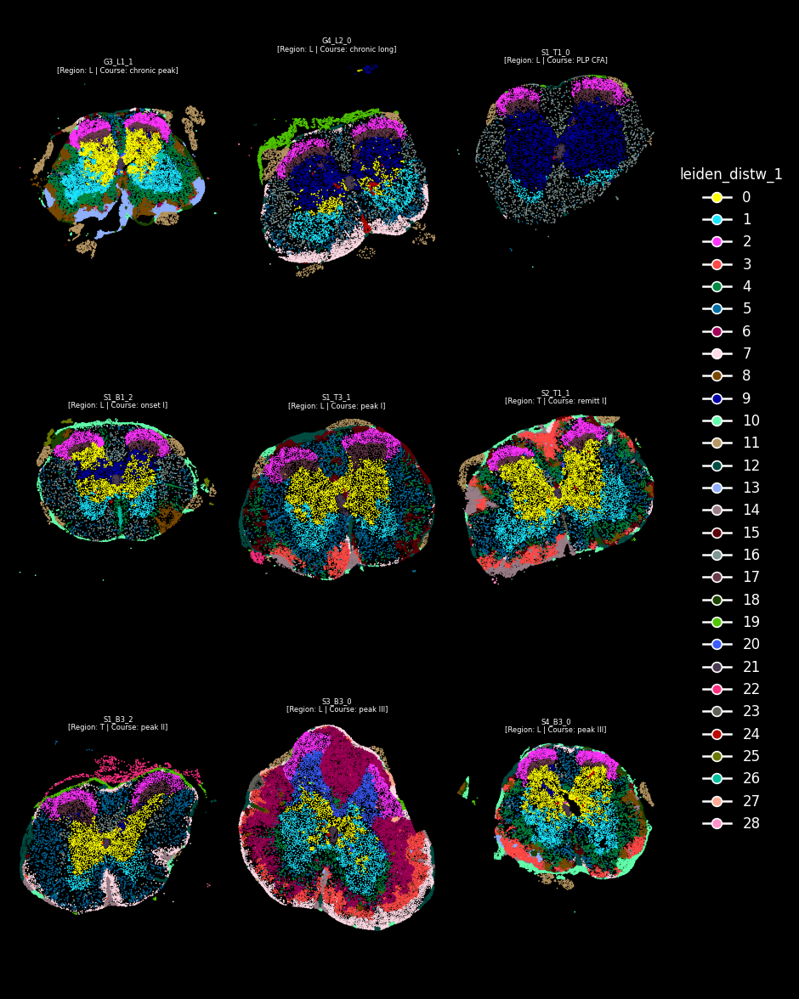

In [16]:
# usage
plot_spatial_compact_fast(
    ad,
    color="leiden_distw_1",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    #highlight=['4','5']
)

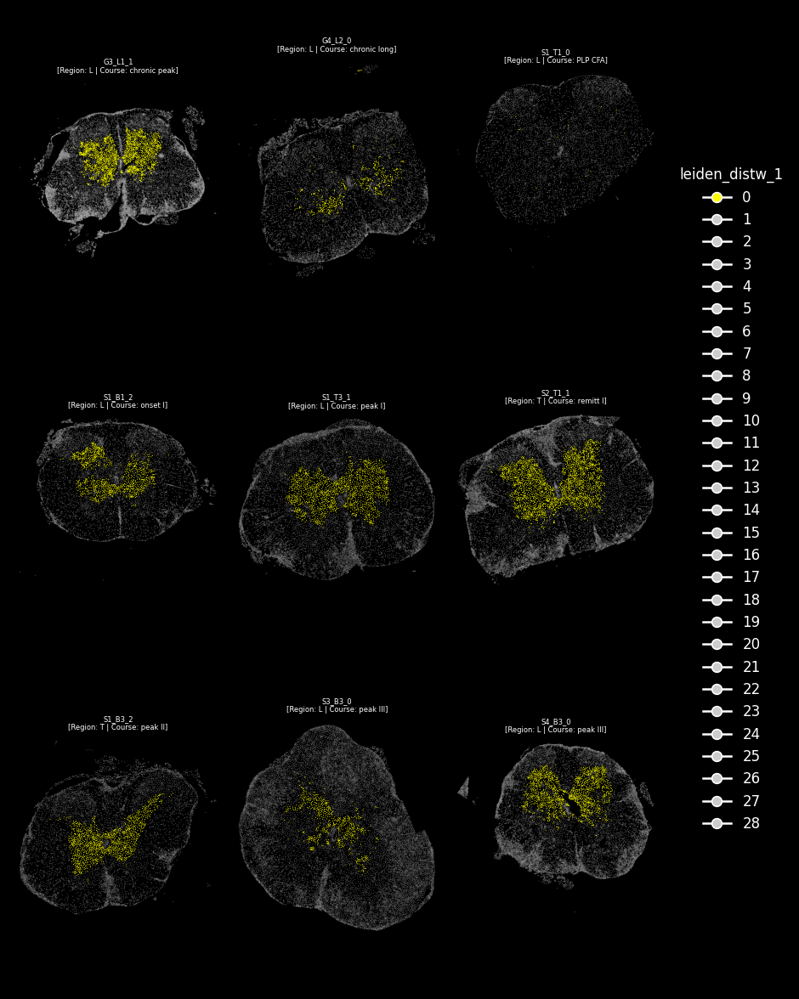

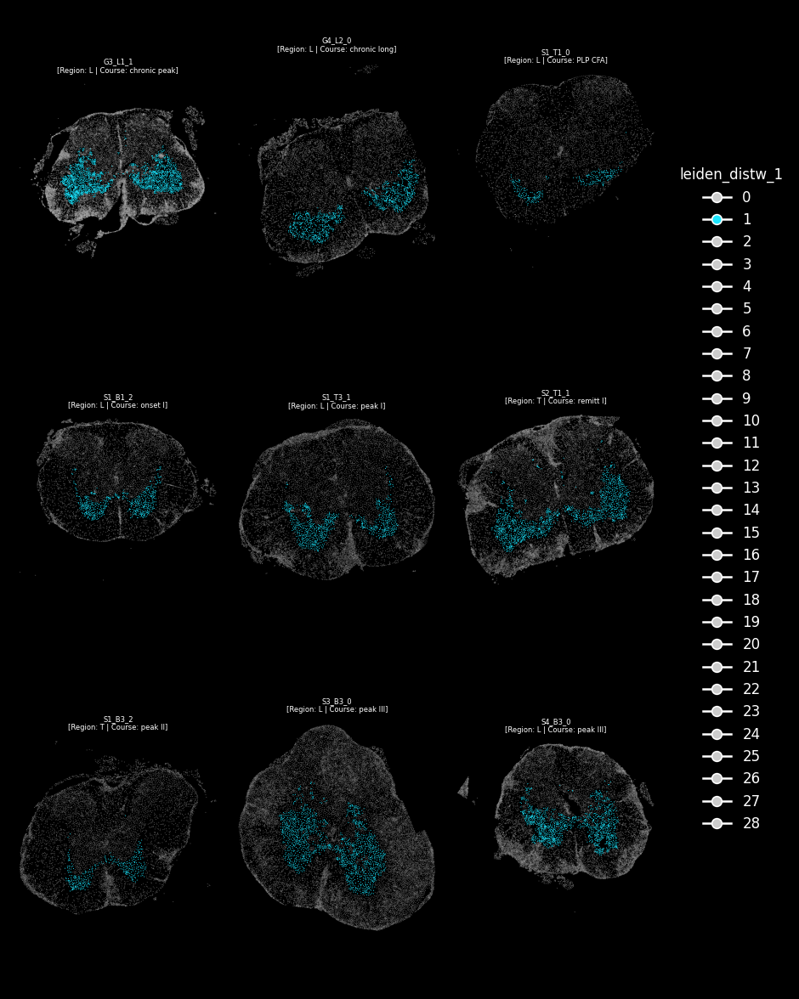

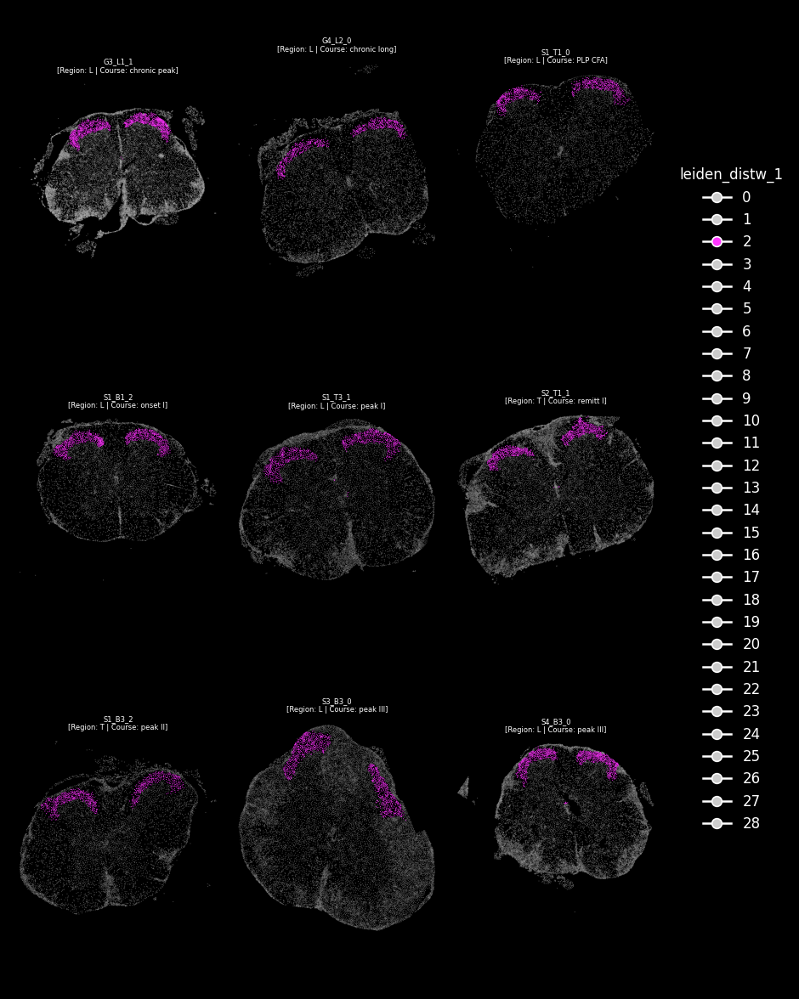

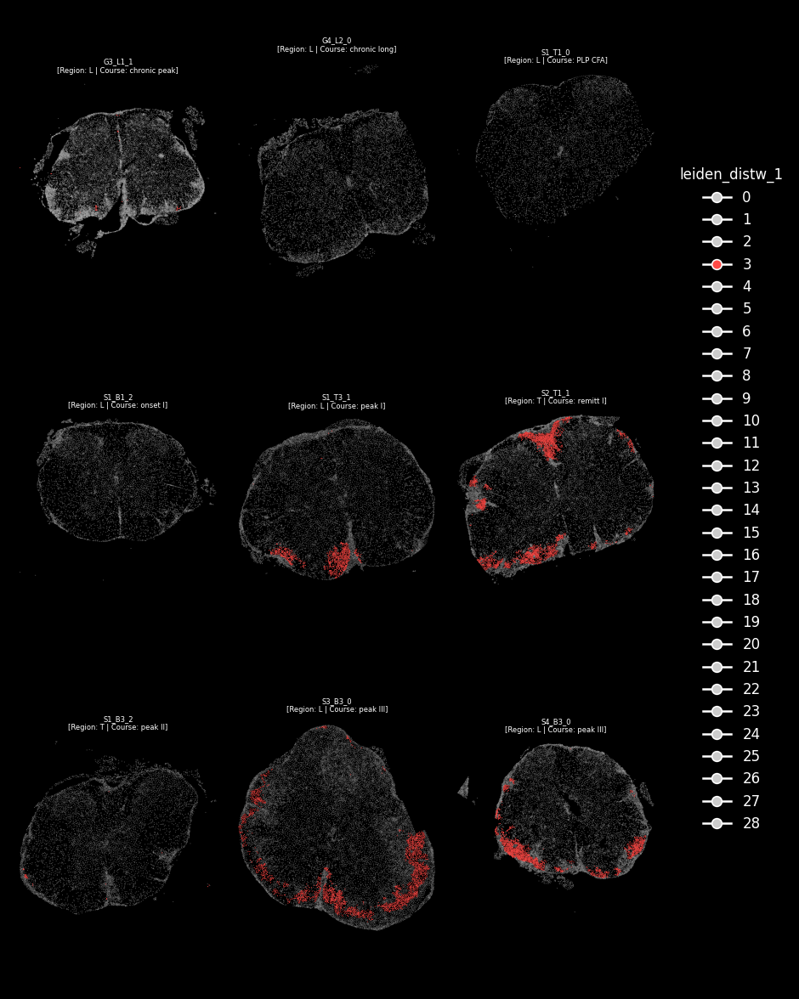

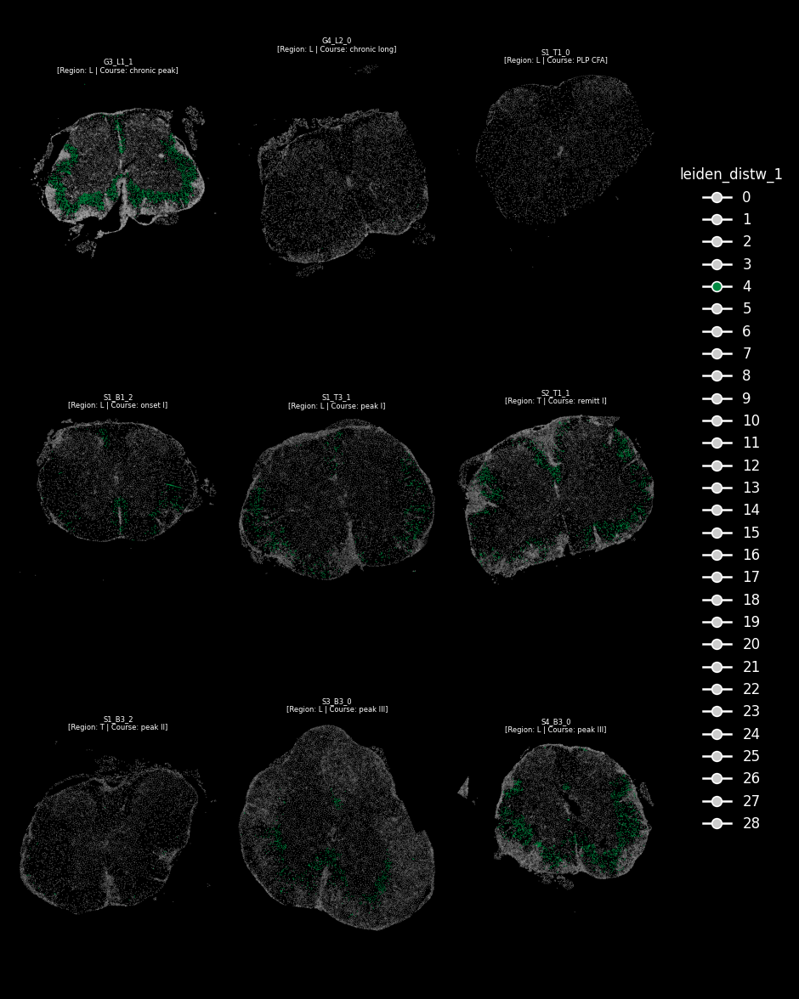

...

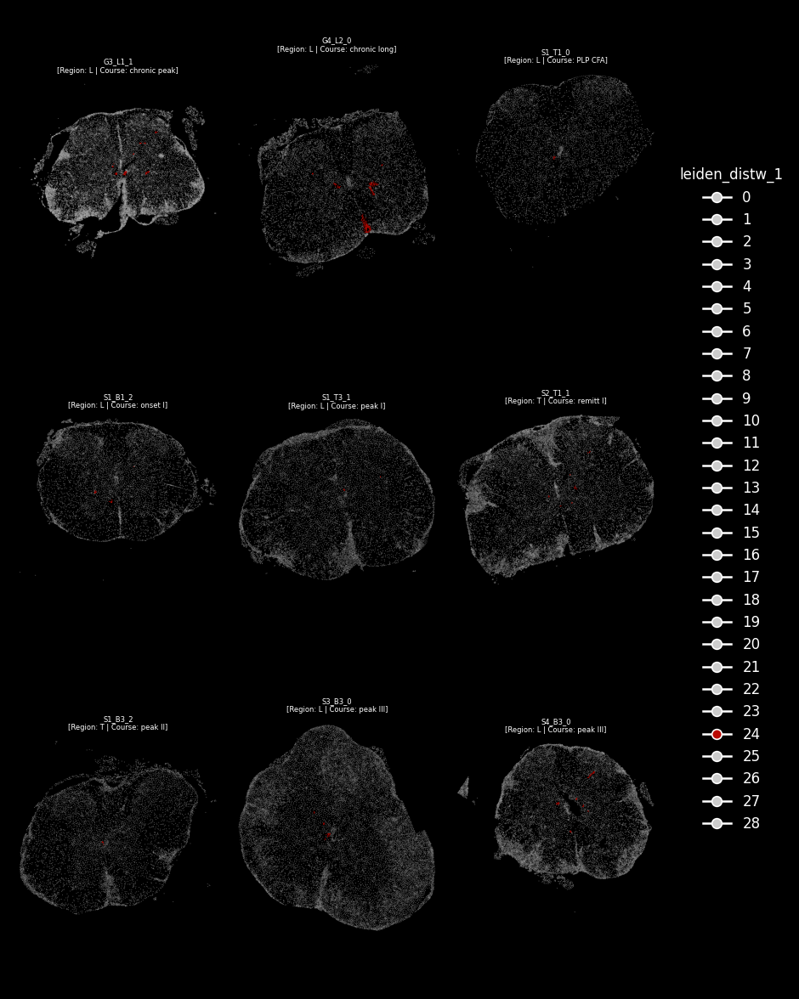

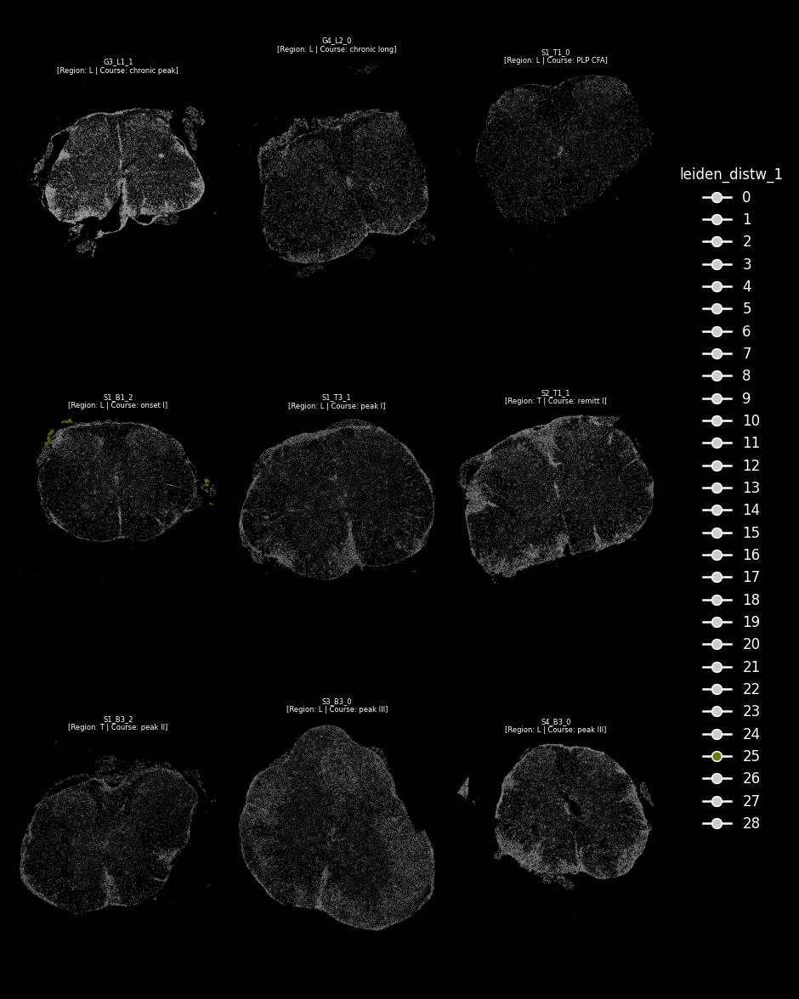

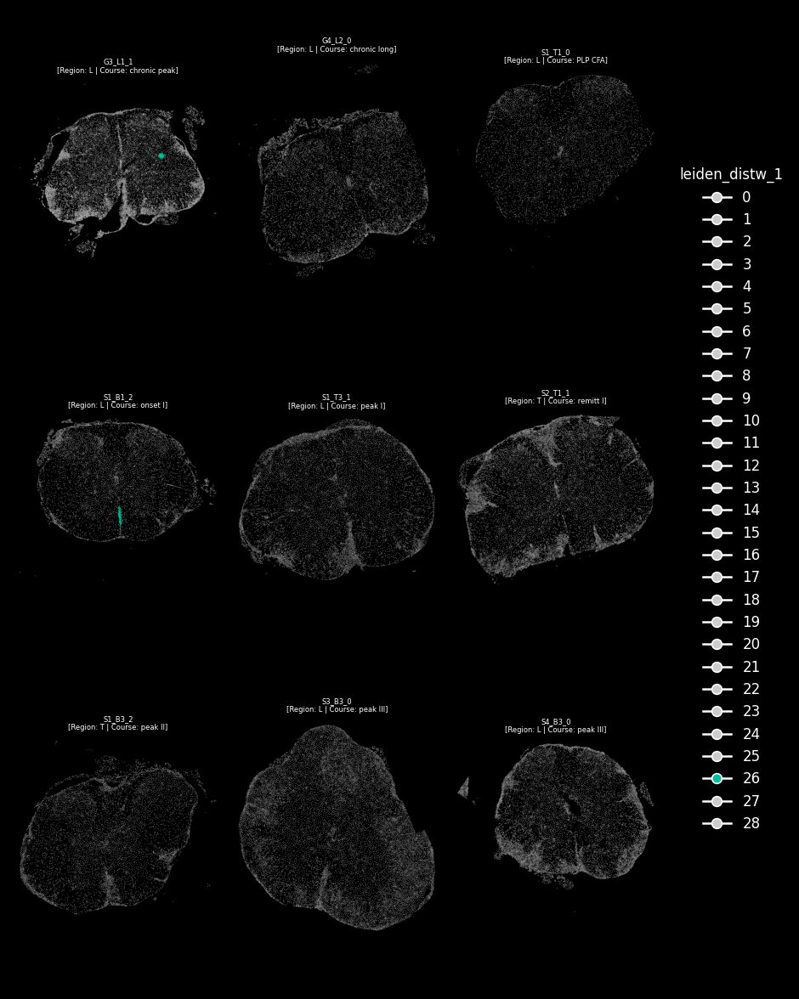

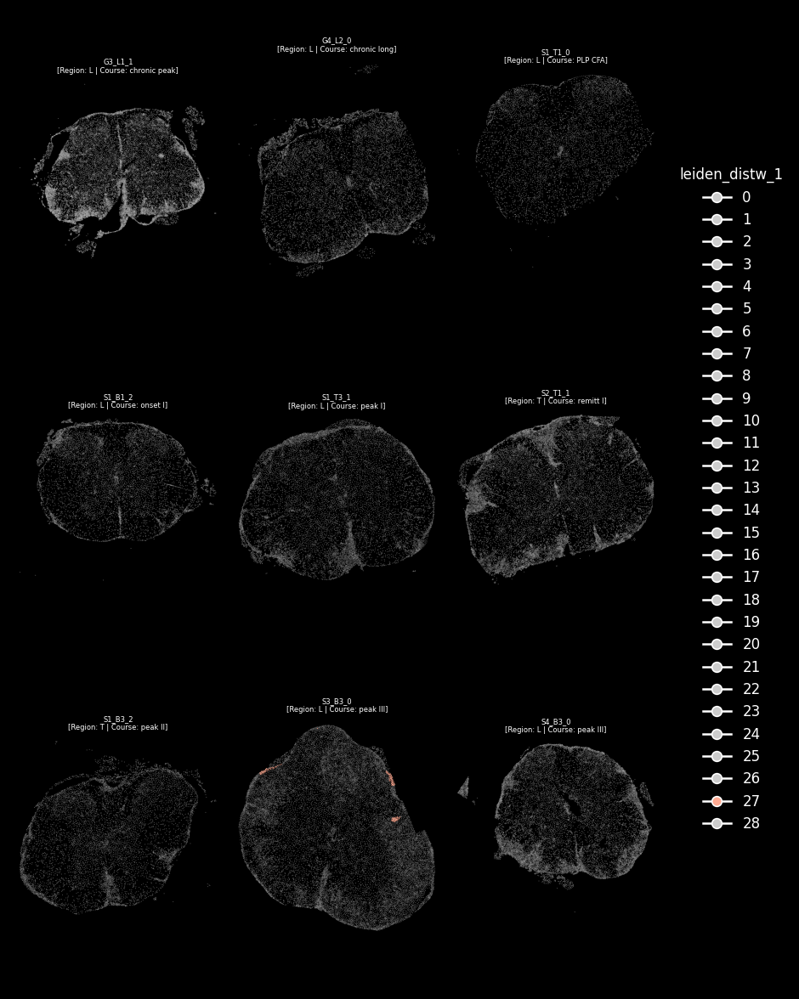

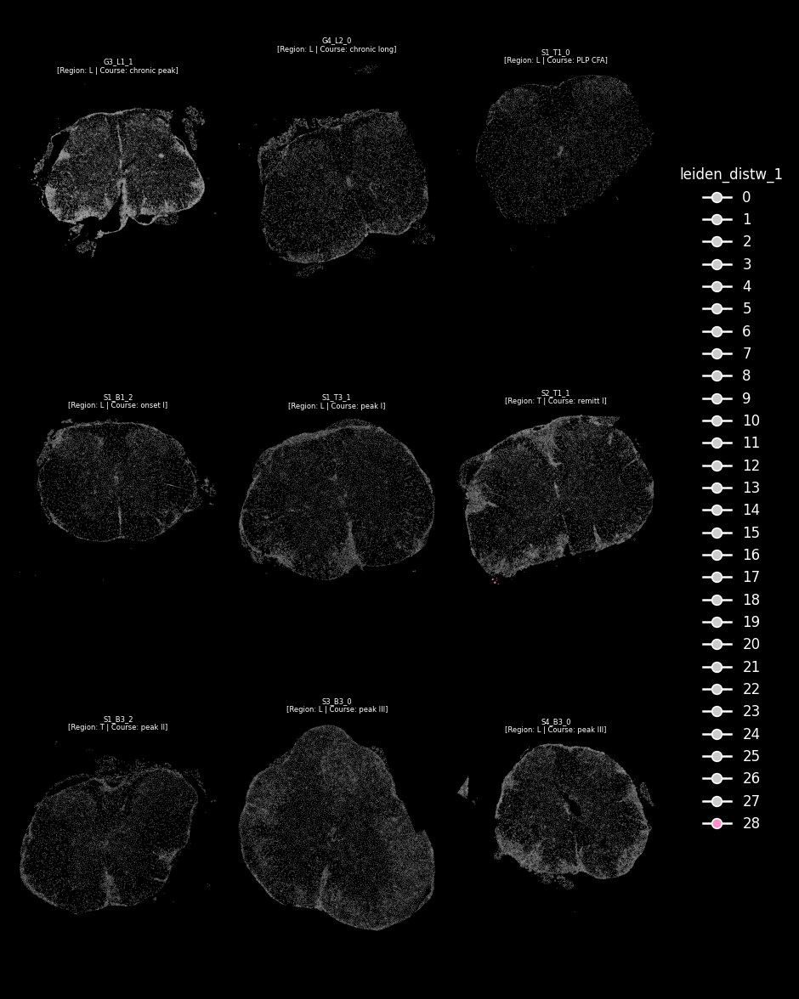

In [17]:
ad.obs['leiden_distw_1'] = ad.obs['leiden_distw_1'].astype('category')
for cluster in ad.obs['leiden_distw_1'].cat.categories:
    # usage
    plot_spatial_compact_fast(
        ad,
        color="leiden_distw_1",
        groupby="sample_id",
        spot_size=0.4,
        cols=3,
        height=10,
        legend_col_width=1.0,
        background="black",
        grey_alpha=0.4,
        highlight=[cluster]
    )

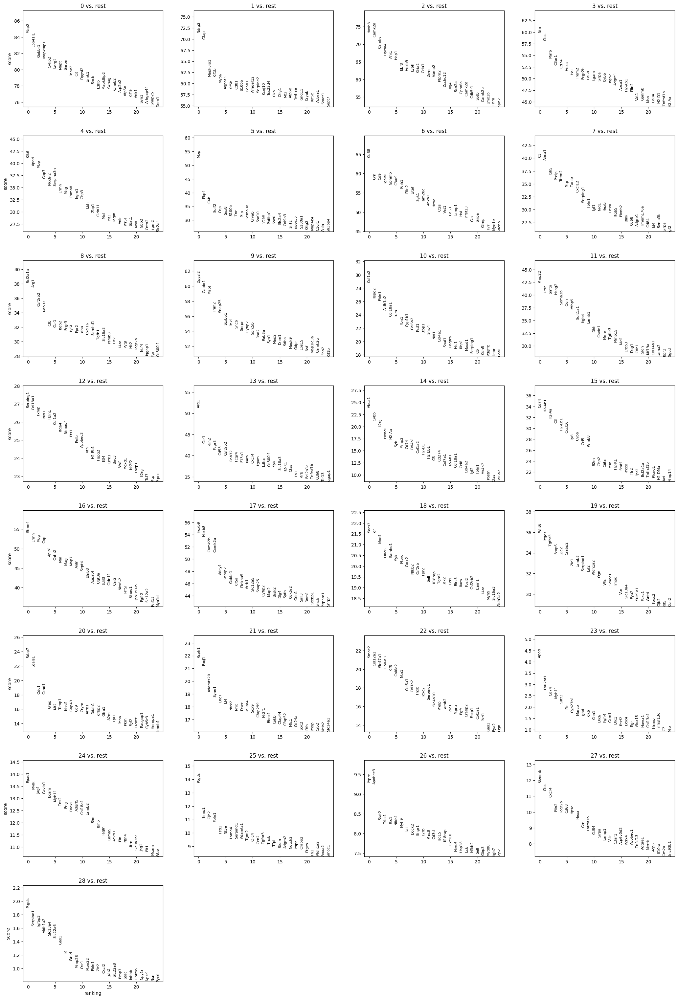

0
Map2 Epb41l1 Gabbr1 Mapk8ip1 Cyfip2 Ndrg2 Mapt Snrpn Panx2 Cit Dpysl2 Limk1 Sncb Ldhb Mapk8ip2 Ywhag Kcnab2 Atp2b2 Atp5o Kif1b Ank1 Syn1 Arhgap44 Snap25 Dnm1 Cdk5r2 Rph3a Rnd2 Agpat3 Pnkd
 
1
Ndrg2 Gfap Mapk8ip1 Kif1b Myo6 Agpat3 Kif5b Cd81 S100b Ddah1 Arhgef12 Serpine2 Kcnj10 Tsc22d4 Ckb Olig1 Mt2 Atp5o Ywhae Gng11 Cryab Kif5c Adora1 Smdt1 Sept7 Capn2 S100a1 Atp5f1 Tssc4 Hist1h2bc
 
2
Hoxb8 Camk2a Camkv Hpcal4 Ahi1 Hap1 Ebf3 Hoxb9 Ly6h Gria2 Gria1 Dner Vamp2 Ptprn2 Zcchc12 Dlg4 Scn2a Gpm6a Camk2d Cdk5r1 Sptb Camk2b Lmx1b Thra Syn2 Sst Crmp1 Rasgrf1 Prrc2b Ndn
 
3
Grn Ctss Mafb C3ar1 Cd74 Hexa Hal Trem2 Fcgr2b Cd68 Itgam Sirpa Cybb Itgb2 Adgre1 Abca1 H2-Ab1 Plin2 Vat1 Gpnmb Msn Cd84 H2-D1 Tnfrsf1b H2-Aa Cd300lf Fam20c Syk Rnh1 Ptpn6
 
4
Klk6 Apod Mbp Gbp7 Nkx6-2 Serpina3n Ermn Mag Psmb8 Irgm1 Gbp3 Lbh Zbp1 Cldn11 Mal Ifit3 Tagln Anln Prr5l Stat1 Msn Gbp2 Cntn2 Irgm2 Slc2a4 Map7 Pkp4 Mog H2-T23 Myrf
 
5
Mbp Pkp4 C4b Sulf2 Cnp Sox8 S100b Tnr Pllp Sema3d Cryab Sox10 Vcan Ppfibp1 Sox6 Sl

In [18]:
# --- Find marker genes per cluster ---
sc.tl.rank_genes_groups(ad, groupby="leiden_distw_1", method="t-test")
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

# get a tidy table of top markers
markers = sc.get.rank_genes_groups_df(ad, group=None)
markers.head()
marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

## grey matter

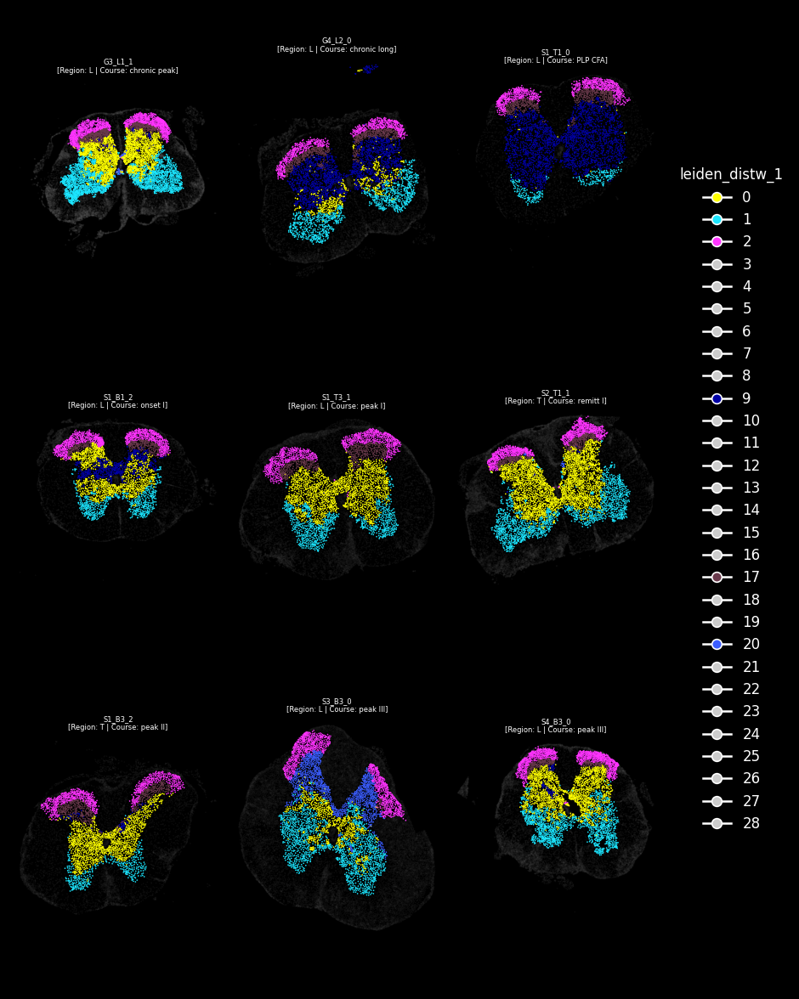

In [22]:
# usage
groups = ['1','0','2','17','9','20']          # <-- your three cluster labels (strings)

plot_spatial_compact_fast(
    ad,
    color="leiden_distw_1",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    highlight=groups
)

## white matter

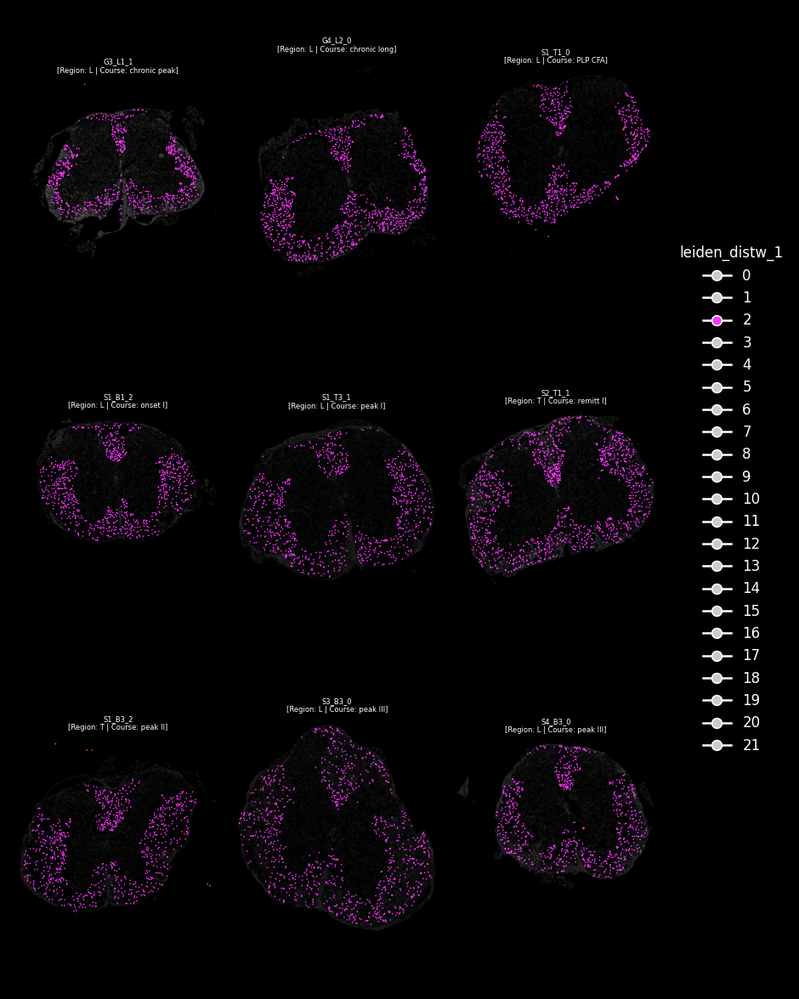

In [64]:
# usage
groups = ['2']          # <-- your three cluster labels (strings)

plot_spatial_compact_fast(
    ad,
    color="leiden_distw_1",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    highlight=groups
)

## lesions

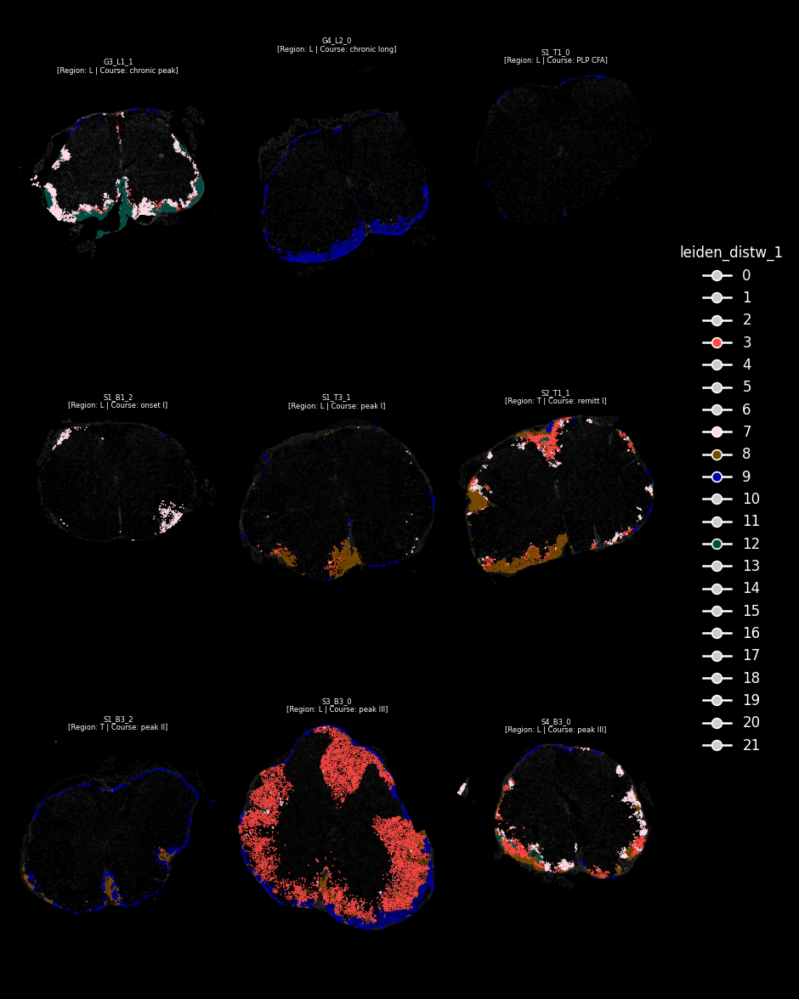

In [59]:
# usage
groups = ['3','7','12','8','9']          # <-- your three cluster labels (strings)

plot_spatial_compact_fast(
    ad,
    color="leiden_distw_1",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    highlight=groups
)

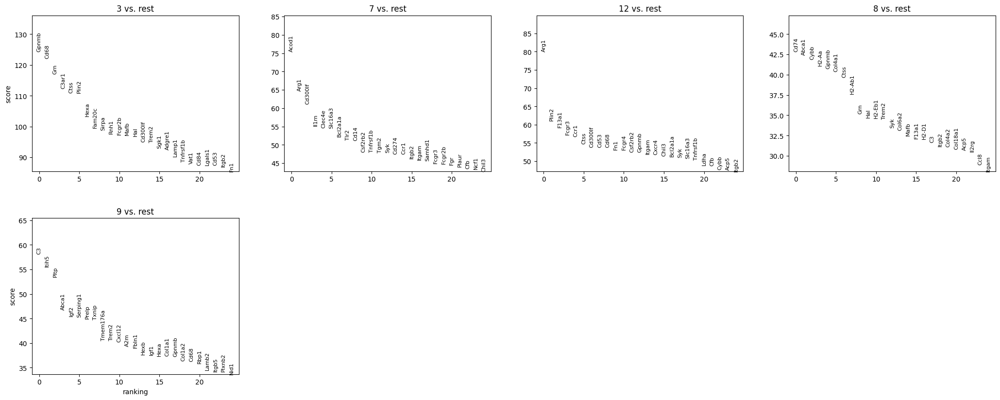

3
Gpnmb Cd68 Grn C3ar1 Ctss Plin2 Hexa Fam20c Sirpa Rnh1 Fcgr2b Mafb Hal Cd300lf Trem2 Sgk1 Adgre1 Lamp1 Tnfrsf1b Vat1 Cd84 Lgals1 Cd53 Itgb2 Fn1 Litaf Itgam Hexb Sdcbp Plau
 
7
Acod1 Arg1 Cd300lf Il1rn Clec4e Slc16a3 Bcl2a1a Tlr2 Cd14 Csf2rb2 Tnfrsf1b Tgm2 Syk Cd274 Ccr1 Itgb2 Itgam Samhd1 Fcgr3 Fcgr2b Fgr Plaur Cfb Ncf1 Chil3 Spi1 Fpr2 Iqgap1 Cybb Csf2rb
 
12
Arg1 Plin2 F13a1 Fcgr3 Ccr1 Ctss Cd300lf Cd53 Cd68 Fn1 Fcgr4 Csf2rb2 Gpnmb Itgam Cxcr4 Chil3 Bcl2a1a Syk Slc16a3 Tnfrsf1b Ldha Cfb Cybb Acp5 Itgb2 Fcgr2b Il4ra Hmox1 Rab32 Cd38
 
8
Cd74 Abca1 Cybb H2-Aa Gpnmb Col4a1 Ctss H2-Ab1 Grn Hal H2-Eb1 Trem2 Syk Col6a2 Mafb F13a1 H2-D1 C3 Itgb2 Col4a2 Col18a1 Acp5 Il2rg Ccl8 Itgam Igf2 Stab1 Col1a2 Mmp2 Mmp14
 
9
C3 Itih5 Pltp Abca1 Igf2 Serping1 Prelp Txnip Tmem176a Trem2 Cxcl12 A2m Fbln1 Hexb Igf1 Hexa Col1a1 Gpnmb Col1a2 Cd68 Rbp1 Lamb2 Itgb5 Plxnb2 Nid1 Slc1a3 Sema3b Id4 Vtn Stab1
 


In [65]:
import scanpy as sc

key = "leiden_distw_1"              # <-- change to your cluster column
groups = ['3','7','12','8','9']         # <-- your three cluster labels (strings)

sc.tl.rank_genes_groups(
    ad,
    groupby=key,
    groups=groups,
    reference="rest",             # each group vs all other cells
    method="wilcoxon",
    pts=True,                     # add fraction expressing
)
sc.pl.rank_genes_groups(ad, n_genes=25, sharey=False)

marker_genes = pd.DataFrame({
    group: ad.uns['rank_genes_groups']['names'][group][:30]
    for group in ad.uns['rank_genes_groups']['names'].dtype.names
})
for col in marker_genes.columns: 
    print(col)
    genes = marker_genes[col].tolist()
    print(" ".join(genes))
    print(' ')

## lymphoid compartmetns

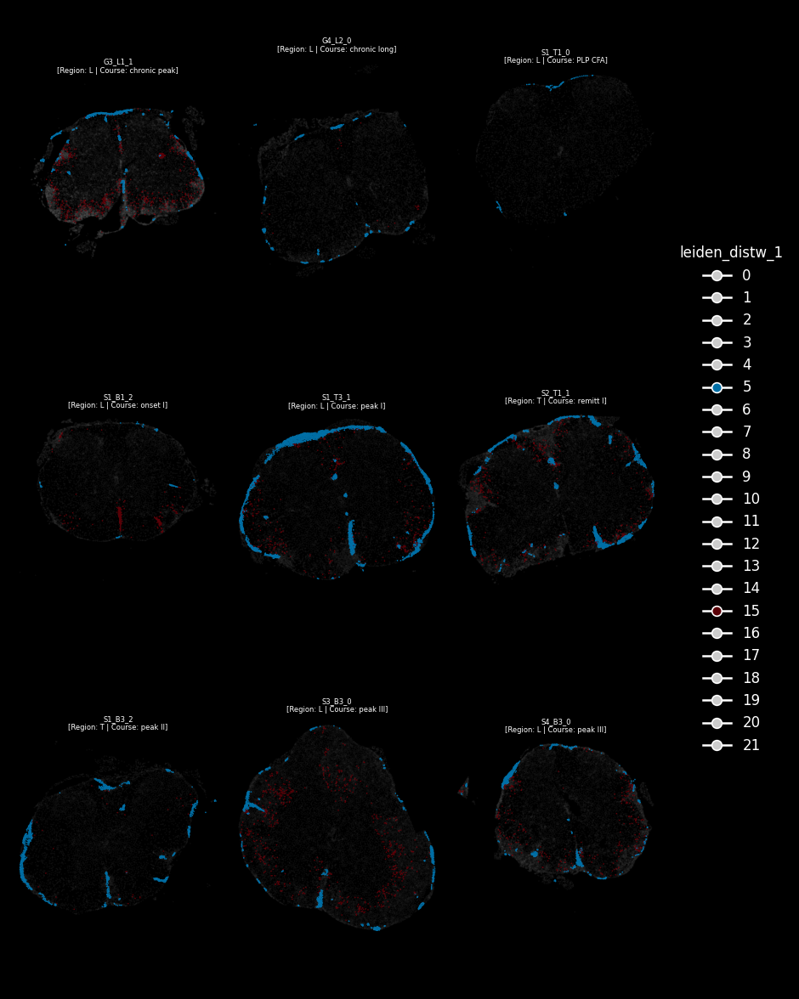

In [60]:
# usage
groups = ['5','15']          # <-- your three cluster labels (strings)

plot_spatial_compact_fast(
    ad,
    color="leiden_distw_1",
    groupby="sample_id",
    spot_size=1,
    cols=3,
    height=10,
    legend_col_width=1.0,
    background="black",
    grey_alpha=0.05,
    highlight=groups
)

In [68]:
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score

key = "leiden_distw_0.4"          # your cluster labels
rep = "X_distweighted_ccstyle"    # or "X_mana_hd" or "X_scVI"

X = ad.obsm[rep]
y = ad.obs[key].astype(str).to_numpy()

sil = silhouette_score(X, y, metric="euclidean")
db  = davies_bouldin_score(X, y)

print("silhouette:", sil)
print("davies_bouldin:", db)

silhouette: 0.11696495115756989
davies_bouldin: 1.9266133200579936


In [ ]:
import numpy as np
from sklearn.metrics import silhouette_score, davies_bouldin_score

key = "leiden_distw_0.4"          # your cluster labels
rep = "X_distweighted_ccstyle"    # or "X_mana_hd" or "X_scVI"

X = ad.obsm[rep]
y = ad.obs[key].astype(str).to_numpy()

sil = silhouette_score(X, y, metric="euclidean")
db  = davies_bouldin_score(X, y)

print("silhouette:", sil)
print("davies_bouldin:", db)